<a href="https://colab.research.google.com/github/ICam99/roboticaMovil/blob/main/Tarea2_IgnacioC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#importar librerías
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import random

In [ ]:
#Los siguientes parámetros se pueden modificar
space_size = 10  # Tamaño del espacio 3d (10x10x10)
min_obstacles = 5 #Tamaño mínimo de obstáculos
max_obstacles = 10 # Tamaño máximo de obstáculos
num_obstacles = random.randint(min_obstacles, max_obstacles) #Genera aleatoriamente cierto núm. de obstáculos

obstacles = []
for _ in range(num_obstacles):
    # Genera aleatoriamente coordenadas para los obstáculos
    center = np.array([random.uniform(0, space_size),
                       random.uniform(0, space_size),
                       random.uniform(0, space_size)])
    # Genera aleatoriamente el radio para cada obstáculo
    radius = random.uniform(0.5, 2)
    obstacles.append({'center': center, 'radius': radius})

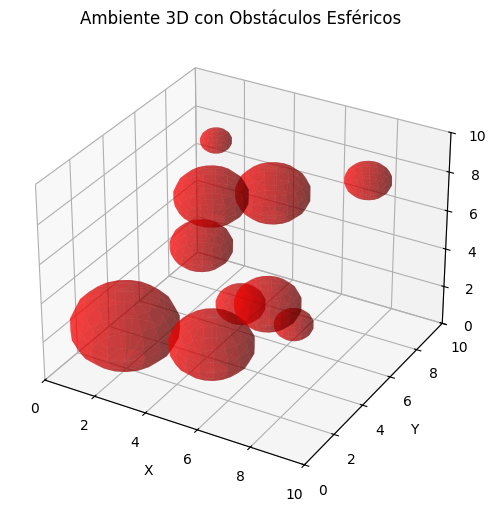

In [ ]:
# Visualizar los obstáculos
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

for obs in obstacles:
    u, v = np.mgrid[0:2*np.pi:20j, 0:np.pi:10j]
    x = obs['center'][0] + obs['radius'] * np.cos(u) * np.sin(v)
    y = obs['center'][1] + obs['radius'] * np.sin(u) * np.sin(v)
    z = obs['center'][2] + obs['radius'] * np.cos(v)
    ax.plot_surface(x, y, z, color="r", alpha=0.5)

ax.set_xlim([0, space_size])
ax.set_ylim([0, space_size])
ax.set_zlim([0, space_size])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title("Ambiente 3D con Obstáculos Esféricos")
plt.show()

In [ ]:
# Funció para rotación de la barra
def rotation_matrix(pitch, yaw, roll):
    # Convertir ángulos a radianes
    pitch = np.radians(pitch)
    yaw = np.radians(yaw)
    roll = np.radians(roll)

    # Matrices de rotación
    Rx = np.array([
        [1, 0, 0],
        [0, np.cos(pitch), -np.sin(pitch)],
        [0, np.sin(pitch), np.cos(pitch)]
    ])

    Ry = np.array([
        [np.cos(yaw), 0, np.sin(yaw)],
        [0, 1, 0],
        [-np.sin(yaw), 0, np.cos(yaw)]
    ])

    Rz = np.array([
        [np.cos(roll), -np.sin(roll), 0],
        [np.sin(roll), np.cos(roll), 0],
        [0, 0, 1]
    ])

    # Combinar las rotaciones
    R = Rz @ Ry @ Rx
    return R

In [ ]:
# Función para generar los puntos de la barra
def generate_bar_points(center, length, pitch, yaw, roll):
    # Puntos iniciales de la barra (alineada con el eje z)
    bar_points = np.array([
        [0, 0, -length / 2],
        [0, 0, length / 2]
    ])

    # Aplicar la rotación
    R = rotation_matrix(pitch, yaw, roll)
    bar_points_rotated = np.dot(bar_points, R.T)

    # Trasladar al centro
    bar_points_rotated += center
    return bar_points_rotated

In [ ]:
# Función de detección de colisiones
def is_collision(bar_points, obstacles):
    for obs in obstacles:
        for point in bar_points:
            distance = np.linalg.norm(point - obs['center'])
            if distance < obs['radius']:
                return True
    return False

In [ ]:
# Muestreo de Monte Carlo para generar el mapa probabilístico
num_samples = 10000  # Número de muestras de Monte Carlo
bar_length = 10.0  # Longitud de la barra
prob_map = np.zeros((num_samples, 6))  # Almacenar posición y orientación

for i in range(num_samples):
    # Generar una posición aleatoria en el espacio 3D
    center = np.random.uniform(0, space_size, 3)

    # Generar ángulos de rotación aleatorios
    pitch = np.random.uniform(0, 360)
    yaw = np.random.uniform(0, 360)
    roll = np.random.uniform(0, 360)

    # Generar puntos de la barra
    bar_points = generate_bar_points(center, bar_length, pitch, yaw, roll)

    # Verificar colisión
    if not is_collision(bar_points, obstacles):
        prob_map[i] = [center[0], center[1], center[2], pitch, yaw, roll]

# Filtrar solo las muestras válidas (sin colisión)
valid_samples = prob_map[~np.all(prob_map == 0, axis=1)]
print(f"Muestras válidas: {len(valid_samples)}/{num_samples}")

Muestras válidas: 9451/10000


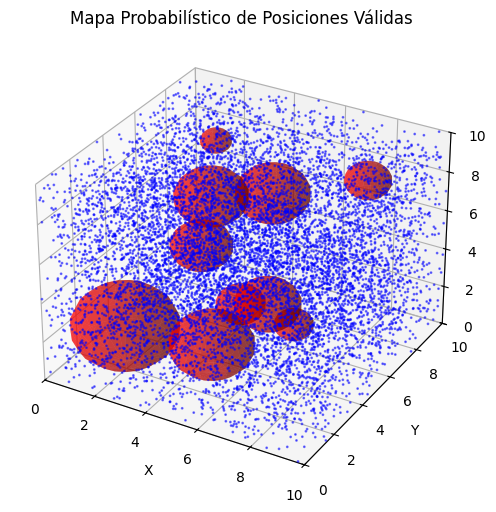

In [ ]:
# Visualización del mapa probabilístico (solo posición)
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Graficar los obstáculos
for obs in obstacles:
    u, v = np.mgrid[0:2*np.pi:20j, 0:np.pi:10j]
    x = obs['center'][0] + obs['radius'] * np.cos(u) * np.sin(v)
    y = obs['center'][1] + obs['radius'] * np.sin(u) * np.sin(v)
    z = obs['center'][2] + obs['radius'] * np.cos(v)
    ax.plot_surface(x, y, z, color="r", alpha=0.5)

# Graficar las muestras válidas
ax.scatter(valid_samples[:, 0], valid_samples[:, 1], valid_samples[:, 2], c='b', s=1, alpha=0.5)

ax.set_xlim([0, space_size])
ax.set_ylim([0, space_size])
ax.set_zlim([0, space_size])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title("Mapa Probabilístico de Posiciones Válidas")
plt.show()

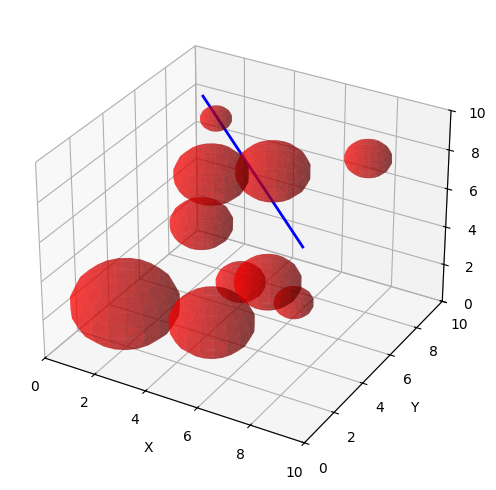

In [ ]:
# Animación del movimiento de la barra
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Configurar límites del espacio
ax.set_xlim([0, space_size])
ax.set_ylim([0, space_size])
ax.set_zlim([0, space_size])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Graficar los obstáculos
for obs in obstacles:
    u, v = np.mgrid[0:2*np.pi:20j, 0:np.pi:10j]
    x = obs['center'][0] + obs['radius'] * np.cos(u) * np.sin(v)
    y = obs['center'][1] + obs['radius'] * np.sin(u) * np.sin(v)
    z = obs['center'][2] + obs['radius'] * np.cos(v)
    ax.plot_surface(x, y, z, color="r", alpha=0.5)

# Seleccionar una muestra válida para animar
sample_index = random.randint(0, len(valid_samples) - 1)
sample = valid_samples[sample_index]
bar_points = generate_bar_points(sample[:3], bar_length, sample[3], sample[4], sample[5])

# Inicializar la barra en la animación
bar_line, = ax.plot(bar_points[:, 0], bar_points[:, 1], bar_points[:, 2], 'b-', linewidth=2)

def update(frame):
    # Actualizar la posición y orientación de la barra
    sample_index = random.randint(0, len(valid_samples) - 1)
    sample = valid_samples[sample_index]
    bar_points = generate_bar_points(sample[:3], bar_length, sample[3], sample[4], sample[5])

    # Actualizar la línea de la barra
    bar_line.set_data(bar_points[:, 0], bar_points[:, 1])
    bar_line.set_3d_properties(bar_points[:, 2])
    return bar_line,

# Crear la animación
ani = FuncAnimation(fig, update, frames=100, interval=200, blit=True)

# Mostrar la animación
HTML(ani.to_jshtml())